# 6 Improving Stability

### Imports:

In [1]:
import keras
from keras.models import load_model
from keras.datasets import cifar10
from keras.layers import Input, Flatten, Reshape, UpSampling2D, Dense, Conv1D, Conv2D, MaxPooling2D, GlobalMaxPooling2D, UpSampling2D, BatchNormalization, Activation
from keras import layers
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras.callbacks import TensorBoard
from sklearn.metrics.pairwise import euclidean_distances
import sys
from matplotlib import pyplot as plt
import tensorflow as tf
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import random
import pickle
import cv2

In [2]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

### Load Dataset & Model

#### Load Data

In [3]:
x_train = pickle.load(open( "./data/x_train.p", "rb" ))
y_train = pickle.load(open( "./data/y_train.p", "rb" ))
x_test  = pickle.load(open( "./data/x_test.p",  "rb" ))
y_test  = pickle.load(open( "./data/y_test.p",  "rb" ))

## 6.3 Querying Modified Data

#### Load new model

In [4]:
# load improved model
autoencoder_improved = keras.models.load_model('./models/autoencoder_improvedStability.hdf5')
encoder_improved = keras.models.load_model('./models/encoder_improvedStability.hdf5')

# load old model
autoencoder_old = keras.models.load_model('./models/autoencoder.hdf5')
encoder_old = keras.models.load_model('./models/encoder.hdf5')

### Query

#### Encode full dataset

Using the encoder model we extract 10 features from all images in the combined test and train dataset.

In [5]:
X = np.r_[x_train, x_test]
c10encoder_X_improved = encoder_improved.predict(X)
c10encoder_X_old = encoder_old.predict(X)

#### Select 20 images and distort them

We are selecting the first 20 images of the combined dataset as test samples. Following we will search for the most similar images for each of the 20 images.

#### Function to add gaussian noise

This function allows to add arbitrary gaussian noise to a set of training data and returns the image set containing this noise.

In [6]:
def addGaussianNoise(images, mean, sigma, factor):
    number, row, col, ch = images.shape
    
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisyImages = images + factor * gauss
    noisyImages = np.clip(noisyImages, 0., 1.)
    
    return noisyImages

#### Function to distort image

This function allows to apply a projective transformation to a single image that is returned. The images maintain their size (32x32x3). As library for he transformation c2 is used.

In [7]:
def distortImg(image, dCoeff = 0.1):
    image = image * 255
    rows, cols = image.shape[:2]

    src_points = np.float32([[0,0], [cols-1,0], [0,rows-1], [cols-1,rows-1]])
    dst_points = np.float32([[0,0], [cols-1,0], [int(dCoeff*cols),rows-1], [int((1-dCoeff)*cols),rows-1]]) 
    projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
    img_output = cv2.warpPerspective(image, projective_matrix, (cols,rows))

    return img_output/255

#### Function to show example images

In [8]:
# definition to show original image and reconstructed image
def showDecodedImages(orig, dec, num=10):
    import matplotlib.pyplot as plt
    n = num
    plt.figure(figsize=(20, 4))

    for i in range(n):
        # display original
        ax = plt.subplot(2, n, i+1)
        plt.imshow(orig[i].reshape(32, 32, 3))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display reconstruction
        ax = plt.subplot(2, n, i +1 + n)
        plt.imshow(dec[i].reshape(32, 32, 3))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

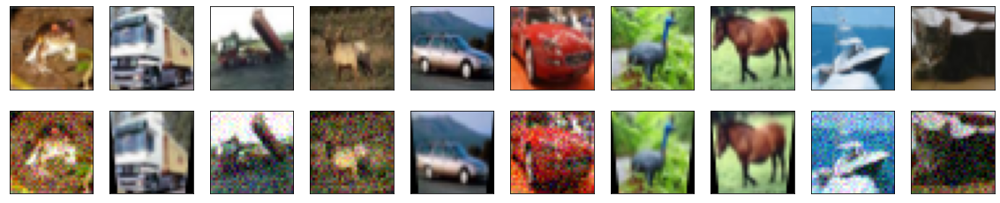

In [9]:
X_20 = np.array(X[:20])

# number of images to be replaced with distortet images in training data
n = 20 #all images

# choose n random indices without duplicates
indices_rand = random.sample(range(0, X_20.shape[0]), n)

# add gaussian noise to half of the images
X_20[indices_rand[:int(n/2)]] = addGaussianNoise(X_20[indices_rand[:int(n/2)]], 0.0, 1.0, 0.1)

# transform other half of the images
for i in range(int(n/2), len(indices_rand)):
    X_20[indices_rand[i]] = distortImg(X_20[indices_rand[i]])

showDecodedImages(x_train, X_20)

#### Encode sample images

In [10]:
# encode 20 examples
c10encoder_20_improved = encoder_improved.predict(X_20)
c10encoder_20_old = encoder_old.predict(X_20)

#### Implement different distance metrics for calculating pairwise distances of two data tuples 

Use 'euclid', 'manhatten' or 'cosine' as metric input parameter when using this function.

In [11]:
def getPairwiseDistances(tupleA, tupleB, metric):
    dists = np.empty([len(tupleA), len(tupleB)])
    
    if metric == 'euclid':
        dists = euclidean_distances(tupleA, tupleB)
        
    if metric == 'manhatten':
        for i in range(0, len(tupleA)):
            for j in range(0, len(tupleB)):
                dists[i, j] = sum(abs(val1-val2) for val1, val2 in zip(tupleA[i], tupleB[j]))
                
    if metric == 'cosine':
        for i in range(0, len(tupleA)):
            for j in range(0, len(tupleB)):
                dists[i, j] = 1 - np.dot(tupleA[i], tupleB[j])/(np.linalg.norm(tupleA[i]) * np.linalg.norm(tupleB[j]))
        
    return dists

#### Functions to plot most similar images

In [12]:
# definition to show original image and reconstructed image
def showDecodedImages(orig, dec, queryIndex  = 0, num=10):
    import matplotlib.pyplot as plt
    n = num
    plt.figure(figsize=(20, 4))
    plt.suptitle("Query " + str(queryIndex + 1) , fontsize=16)

    for i in range(n):
        # display original
        ax = plt.subplot(2, n, i+1)
        plt.imshow(orig[i].reshape(32, 32, 3))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if(i == 0): ax.set_title("Reference Image:")

        # display reconstruction
        ax = plt.subplot(2, n, i +1 + n)
        plt.imshow(dec[i].reshape(32, 32, 3))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if(i == 0): ax.set_title("Similar Images:")
        
    plt.show()

In [13]:
nofSimImgs = 10
#queryIndex = 6

def plotMostSimilarImages(distances):
    for queryIndex in range(0,20):

        originalImages = []
        similarOriginalImages = []

        # copy distance matrix to allow modifications
        cache = np.array(distances)

        for i in range(0, nofSimImgs):
            originalImages.append(X_20[queryIndex])

            index = np.where(cache[queryIndex] == cache[queryIndex].min())[0][0]
            cache[queryIndex][index] = sys.float_info.max
            similarOriginalImages.append(X[index])

        showDecodedImages(originalImages, similarOriginalImages, queryIndex)

#### Calculate pairwise distances using "euclid" and improved model

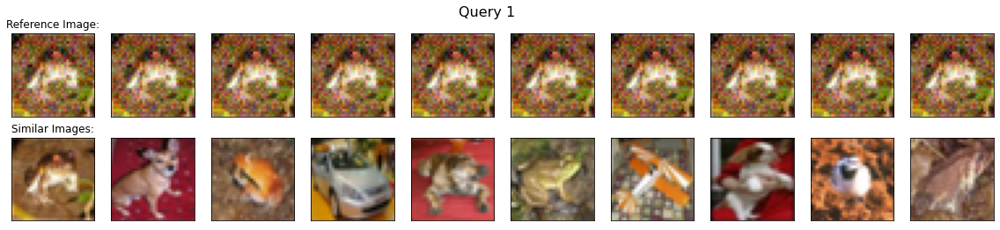

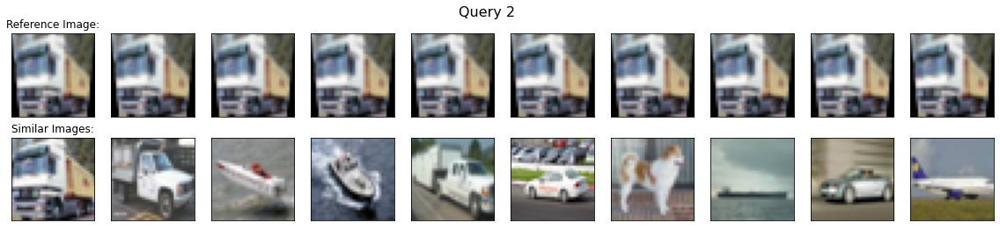

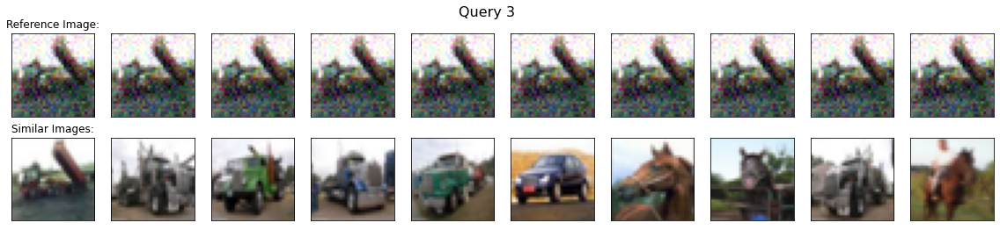

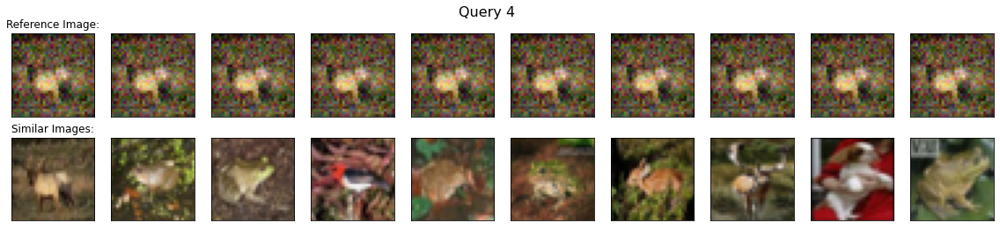

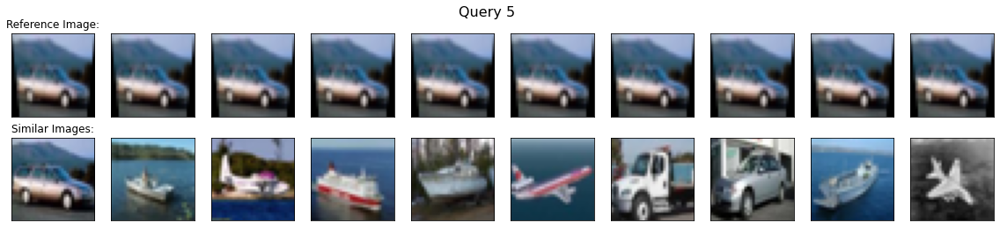

...

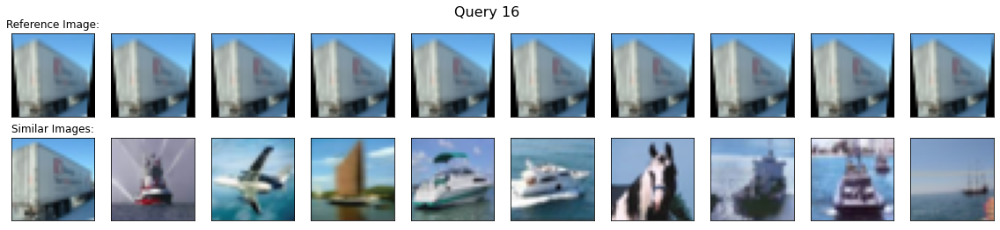

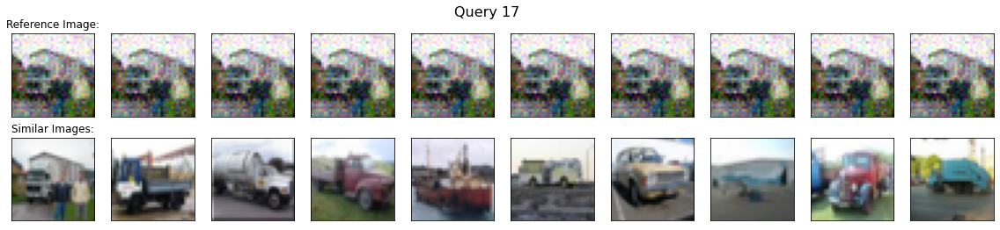

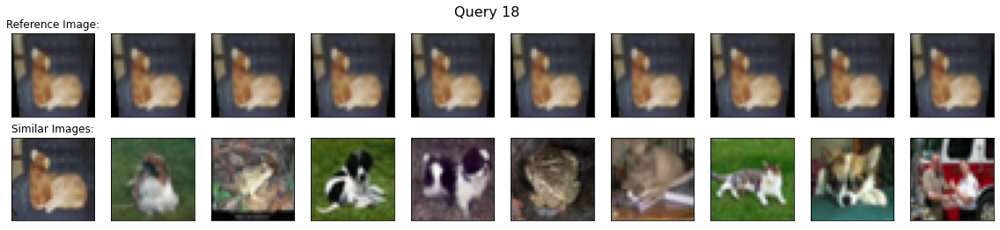

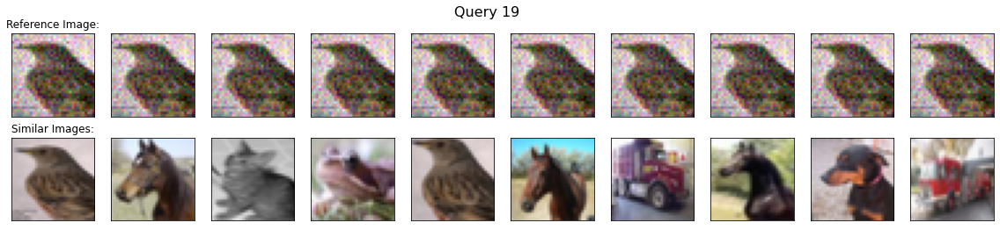

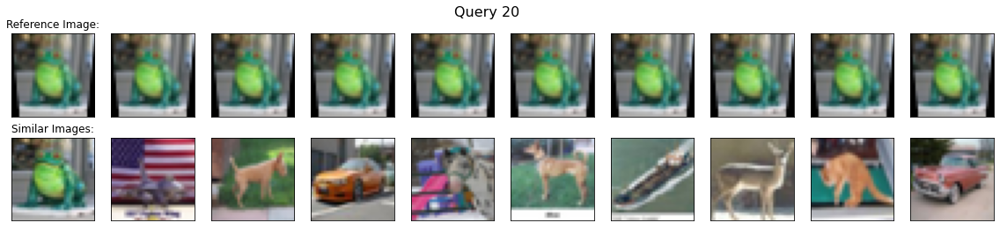

In [14]:
dists = getPairwiseDistances(c10encoder_20_improved, c10encoder_X_improved, 'euclid')
plotMostSimilarImages(dists)

#### Calculate pairwise distances using "euclid" and oldmodel

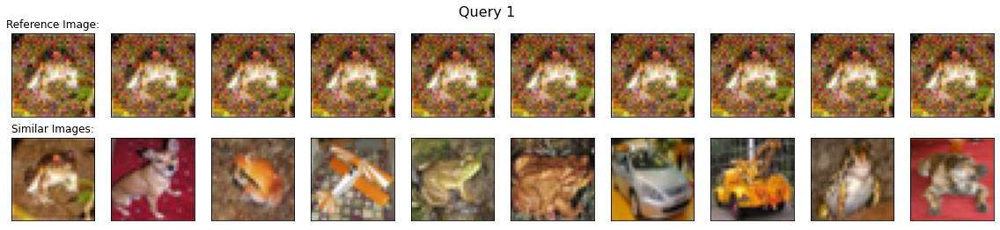

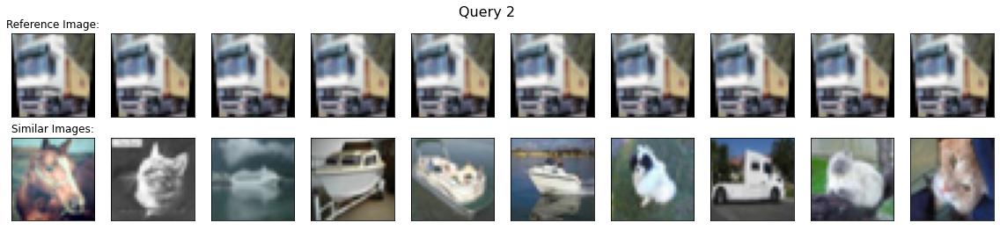

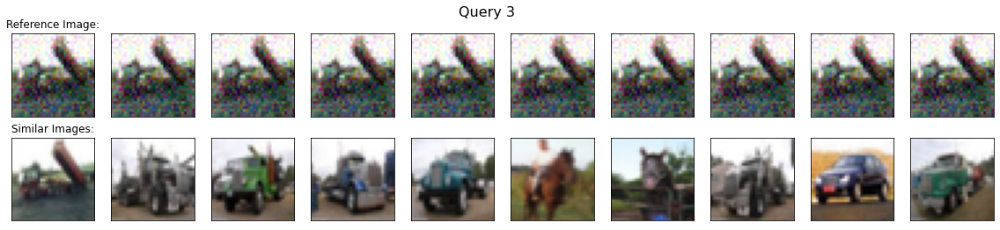

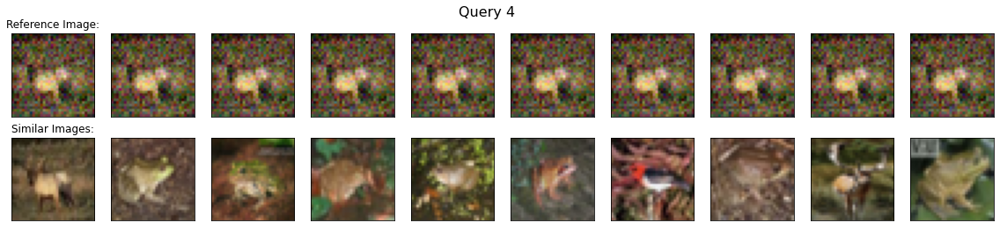

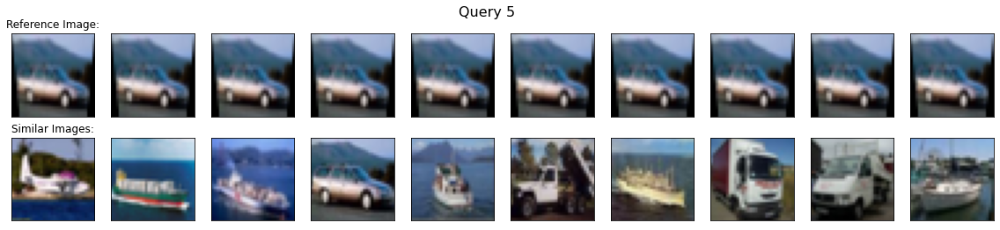

...

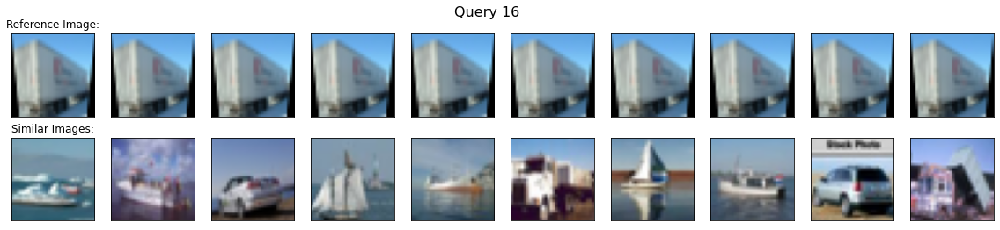

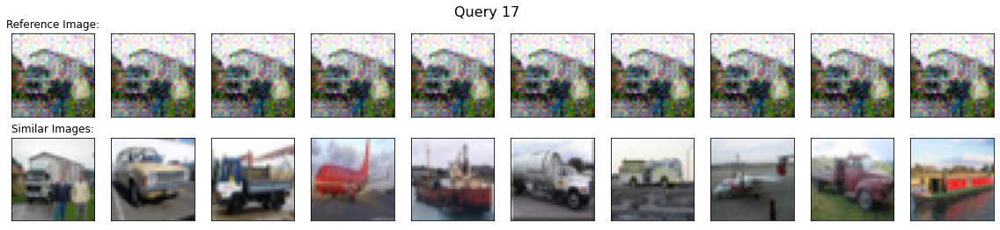

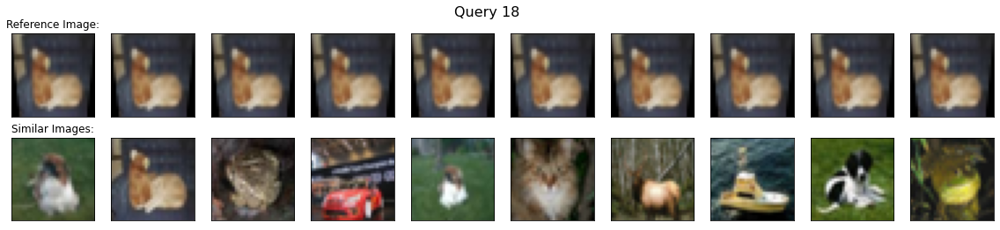

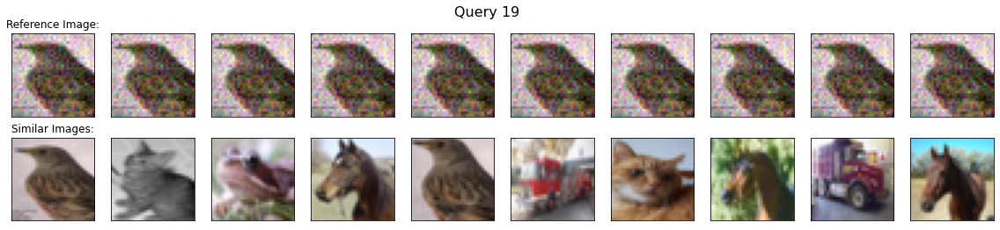

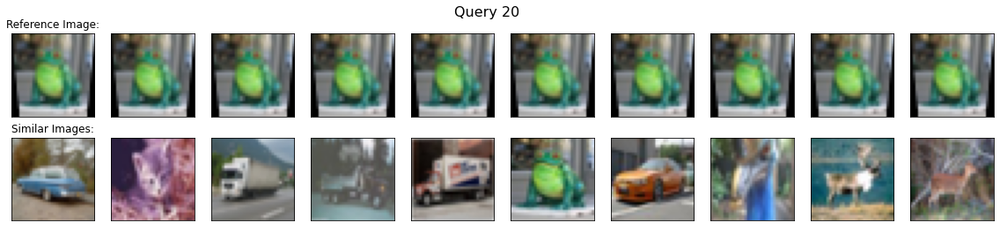

In [15]:
dists = getPairwiseDistances(c10encoder_20_old, c10encoder_X_old, 'euclid')
plotMostSimilarImages(dists)

#### Calculate pairwise distances using "euclid" and improved model but original images as query input

In [16]:
nofSimImgs = 10
#queryIndex = 6

def plotMostSimilarImages(distances, X_20, X):
    for queryIndex in range(0,20):

        originalImages = []
        similarOriginalImages = []

        # copy distance matrix to allow modifications
        cache = np.array(distances)

        for i in range(0, nofSimImgs):
            originalImages.append(X_20[queryIndex])

            index = np.where(cache[queryIndex] == cache[queryIndex].min())[0][0]
            cache[queryIndex][index] = sys.float_info.max
            similarOriginalImages.append(X[index])

        showDecodedImages(originalImages, similarOriginalImages, queryIndex)

In [17]:
# encode 20 examples
c10encoder_20_improved_normal = encoder_improved.predict(np.array(X[:20]))
c10encoder_X_improved = encoder_improved.predict(np.array(X))

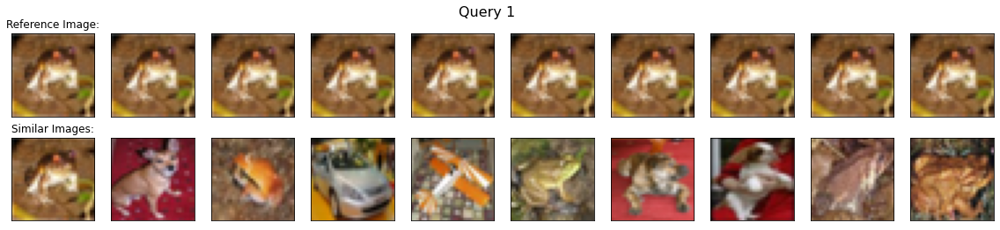

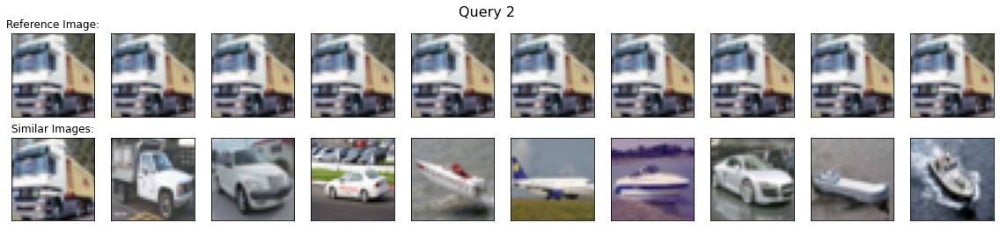

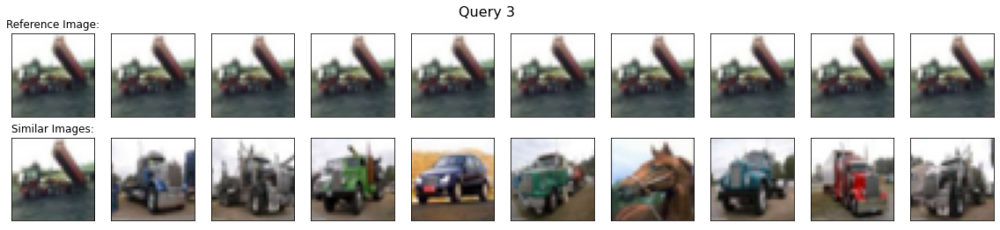

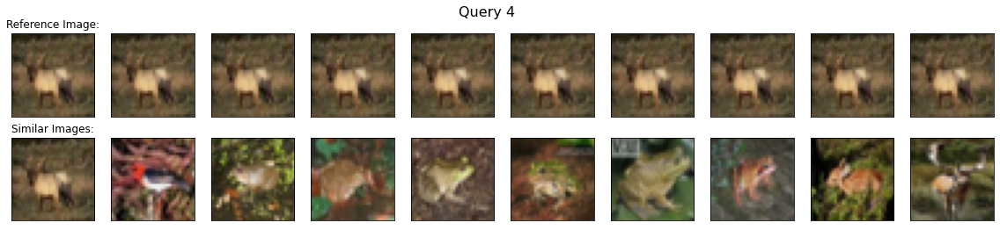

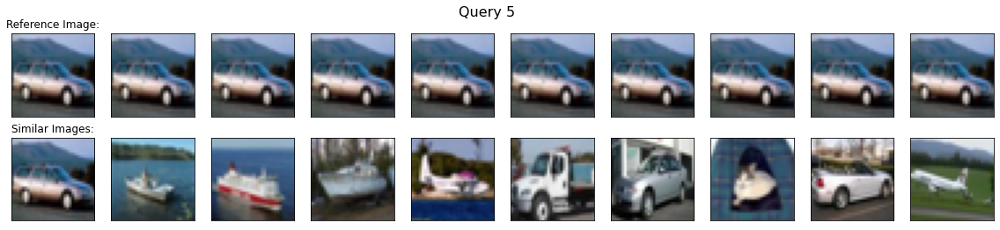

...

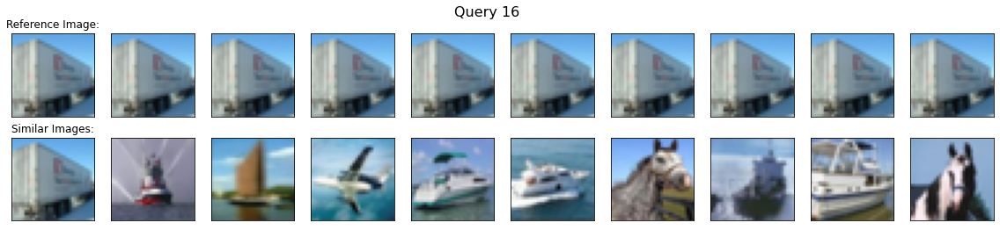

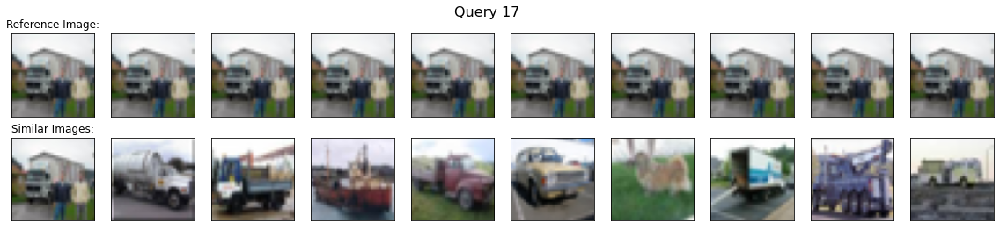

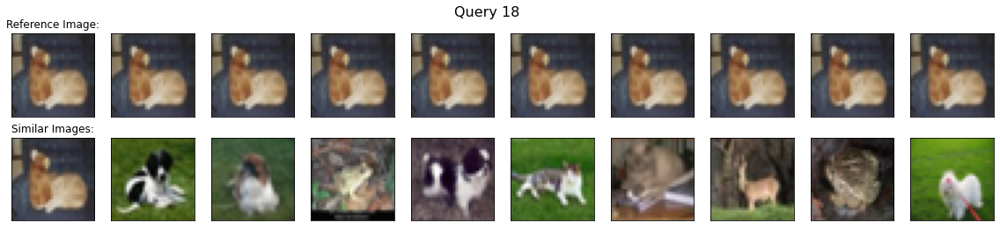

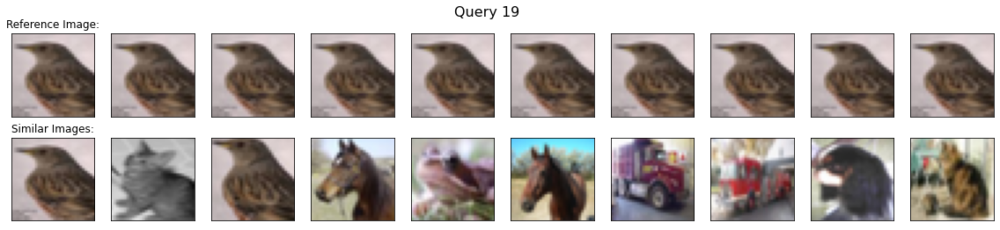

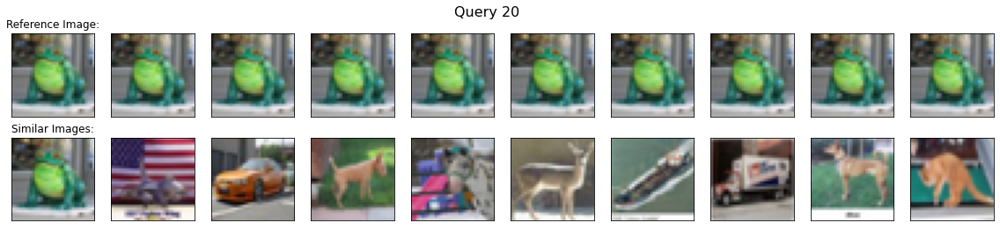

In [18]:
dists = getPairwiseDistances(c10encoder_20_improved_normal, c10encoder_X_improved, 'euclid')
plotMostSimilarImages(dists, X[:20], X)